# Exploratory Data Analysis - Emotion Detection Dataset

Notebook ini melakukan analisis eksplorasi data (Exploratory Data Analysis/EDA) secara menyeluruh pada dataset emotion-8 format YOLO. Kegiatan yang dilakukan meliputi:
- Memuat dan mengeksplorasi struktur dataset
- Menganalisis distribusi setiap kelas emosi
- Menampilkan contoh gambar beserta anotasi bounding box
- Menganalisis karakteristik bounding box
- Menampilkan sampel gambar dari masing-masing kelas emosi

## Import Libraries

In [57]:
import os
import yaml
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict, Counter
import random
print("Libraries imported successfully!")

Libraries imported successfully!


## Load Dataset Configuration

We'll load the `data.yaml` file to understand the dataset structure, class names, and file paths.

In [58]:
# Define dataset paths
DATASET_PATH = "emotion-8"
DATA_YAML = os.path.join(DATASET_PATH, "data.yaml")

# Load the data.yaml file
with open(DATA_YAML, 'r') as f:
    data_config = yaml.safe_load(f)

# Store class names for later use
class_names = data_config['names']
num_classes = data_config['nc']

# Define paths for train, valid, and test sets
train_images = os.path.join(DATASET_PATH, "train", "images")
train_labels = os.path.join(DATASET_PATH, "train", "labels")
valid_images = os.path.join(DATASET_PATH, "valid", "images")
valid_labels = os.path.join(DATASET_PATH, "valid", "labels")
test_images = os.path.join(DATASET_PATH, "test", "images")
test_labels = os.path.join(DATASET_PATH, "test", "labels")

## Load and Parse YOLO Labels

YOLO format labels are stored as text files with one line per object:
- `class_id center_x center_y width height` (all normalized to 0-1)

Let's create functions to parse these labels.

In [59]:
def parse_yolo_label(label_path):
    """
    Parse a YOLO format label file.
    Returns a list of (class_id, center_x, center_y, width, height) tuples.
    """
    annotations = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id = int(parts[0])
                    center_x = float(parts[1])
                    center_y = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])
                    annotations.append((class_id, center_x, center_y, width, height))
    return annotations

def get_all_labels(labels_dir):
    """
    Get all labels from a directory.
    Returns a list of all annotations.
    """
    all_annotations = []
    label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]
    
    for label_file in label_files:
        label_path = os.path.join(labels_dir, label_file)
        annotations = parse_yolo_label(label_path)
        all_annotations.extend(annotations)
    
    return all_annotations

# Test the function
sample_labels = get_all_labels(train_labels)
print(f"Total annotations in training set: {len(sample_labels)}")
print(f"Sample annotation: {sample_labels[0] if sample_labels else 'No annotations found'}")

Total annotations in training set: 1498
Sample annotation: (4, 0.48984375, 0.46953125, 0.69375, 0.83125)


## Count Images per Class

Now let's count how many instances of each emotion class exist in the training data.

In [60]:
# Count class instances in each split
def count_classes(labels_dir, class_names):
    """Count instances of each class in a label directory."""
    class_counts = {name: 0 for name in class_names}
    label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]
    
    for label_file in label_files:
        label_path = os.path.join(labels_dir, label_file)
        annotations = parse_yolo_label(label_path)
        for ann in annotations:
            class_id = ann[0]
            if 0 <= class_id < len(class_names):
                class_counts[class_names[class_id]] += 1
    
    return class_counts

# Count classes for each split
train_class_counts = count_classes(train_labels, class_names)
valid_class_counts = count_classes(valid_labels, class_names)
test_class_counts = count_classes(test_labels, class_names)

# Create DataFrame for better visualization
df_counts = pd.DataFrame({
    'Emotion': class_names,
    'Train': [train_class_counts[name] for name in class_names],
    'Valid': [valid_class_counts[name] for name in class_names],
    'Test': [test_class_counts[name] for name in class_names]
})
df_counts['Total'] = df_counts['Train'] + df_counts['Valid'] + df_counts['Test']

print("\nClass Distribution:")
df_counts
print("="*70)
print(df_counts.to_string(index=False))


Class Distribution:
 Emotion  Train  Valid  Test  Total
   angry    115     12    14    141
   happy    234     31    27    292
   relax    383    108    47    538
    rock    203     20    27    250
romantic    183     24    25    232
     sad    222     42    26    290
surprise    158     21    21    200


## Visualize Class Distribution
Let's create visualizations to better understand the class distribution in our training data.

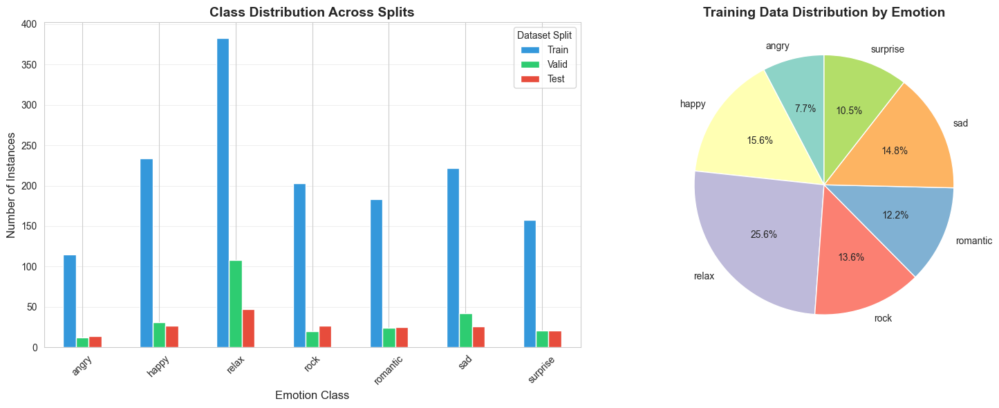

In [61]:
# Create subplots for bar chart and pie chart
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart showing distribution across splits
df_counts_plot = df_counts[['Emotion', 'Train', 'Valid', 'Test']].set_index('Emotion')
df_counts_plot.plot(kind='bar', ax=axes[0], color=['#3498db', '#2ecc71', '#e74c3c'])
axes[0].set_title('Class Distribution Across Splits', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Emotion Class', fontsize=12)
axes[0].set_ylabel('Number of Instances', fontsize=12)
axes[0].legend(title='Dataset Split')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', alpha=0.3)

# Pie chart for training data
train_counts = df_counts.set_index('Emotion')['Train']
colors = plt.cm.Set3(range(len(class_names)))
axes[1].pie(train_counts, labels=train_counts.index, autopct='%1.1f%%', 
            startangle=90, colors=colors)
axes[1].set_title('Training Data Distribution by Emotion', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

## Analyze Bounding Box Statistics
Let's examine the statistics of bounding boxes to understand their size distribution.

Bounding Box Statistics (normalized coordinates):
             Width       Height         Area
count  1498.000000  1498.000000  1498.000000
mean      0.465384     0.553362     0.353124
std       0.299689     0.345129     0.309774
min       0.000781     0.000781     0.000001
25%       0.148438     0.170313     0.026096
50%       0.531250     0.652344     0.327607
75%       0.680469     0.854688     0.566276
max       1.000000     1.000000     1.000000


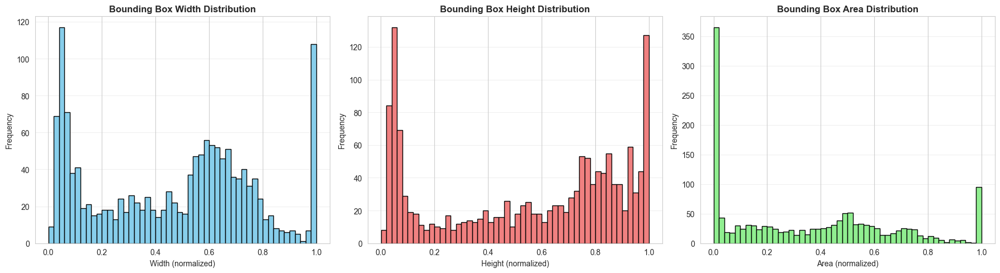

In [62]:
# Collect bounding box statistics
bbox_widths = []
bbox_heights = []
bbox_areas = []

train_annotations = get_all_labels(train_labels)

for ann in train_annotations:
    _, _, _, width, height = ann
    bbox_widths.append(width)
    bbox_heights.append(height)
    bbox_areas.append(width * height)

# Create statistics DataFrame
bbox_stats = pd.DataFrame({
    'Width': bbox_widths,
    'Height': bbox_heights,
    'Area': bbox_areas
})

print("Bounding Box Statistics (normalized coordinates):")
print("="*70)
print(bbox_stats.describe())

# Visualize distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Width distribution
axes[0].hist(bbox_widths, bins=50, color='skyblue', edgecolor='black')
axes[0].set_title('Bounding Box Width Distribution', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Width (normalized)')
axes[0].set_ylabel('Frequency')
axes[0].grid(axis='y', alpha=0.3)

# Height distribution
axes[1].hist(bbox_heights, bins=50, color='lightcoral', edgecolor='black')
axes[1].set_title('Bounding Box Height Distribution', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Height (normalized)')
axes[1].set_ylabel('Frequency')
axes[1].grid(axis='y', alpha=0.3)

# Area distribution
axes[2].hist(bbox_areas, bins=50, color='lightgreen', edgecolor='black')
axes[2].set_title('Bounding Box Area Distribution', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Area (normalized)')
axes[2].set_ylabel('Frequency')
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Visualize 10 Images from Each Class
This function allows you to visualize 10 images from any specific emotion class to better understand the visual patterns and variations within that emotion.

Found 10 images for emotion: 'happy' in train dataset



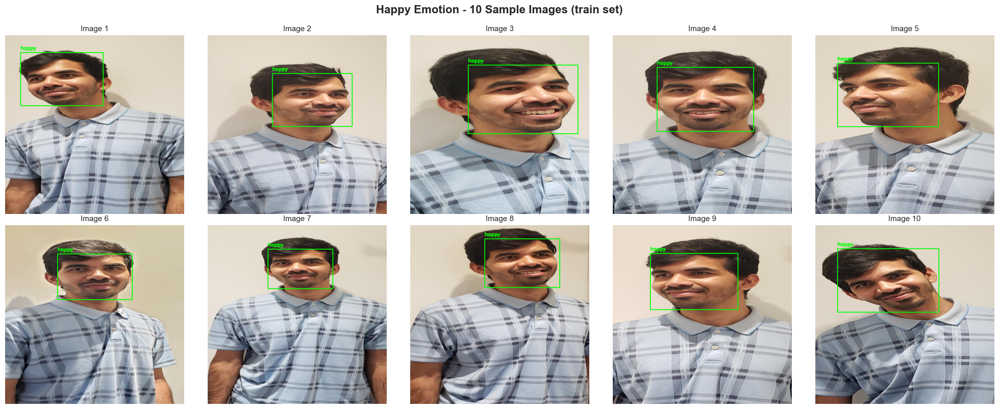

Found 10 images for emotion: 'angry' in train dataset



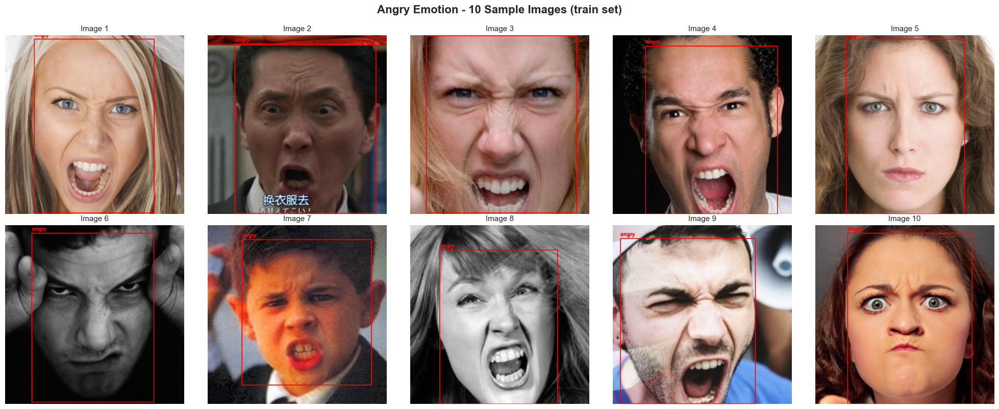

Found 10 images for emotion: 'sad' in train dataset



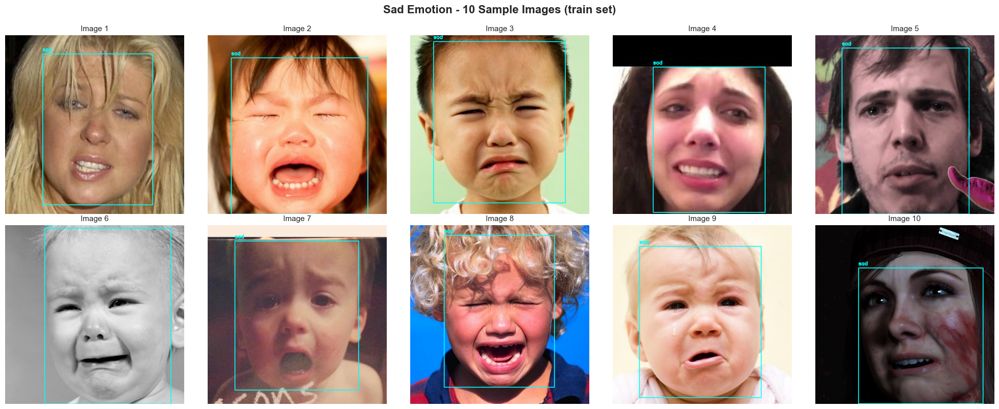

Found 10 images for emotion: 'surprise' in train dataset



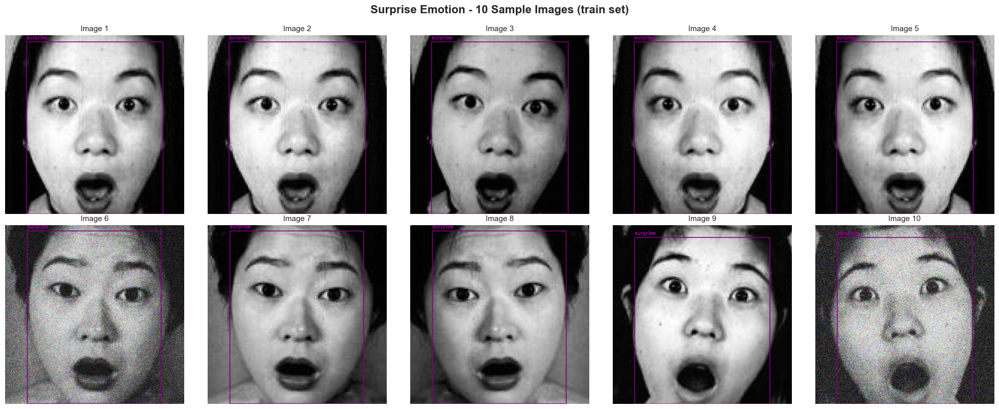

Found 10 images for emotion: 'relax' in train dataset



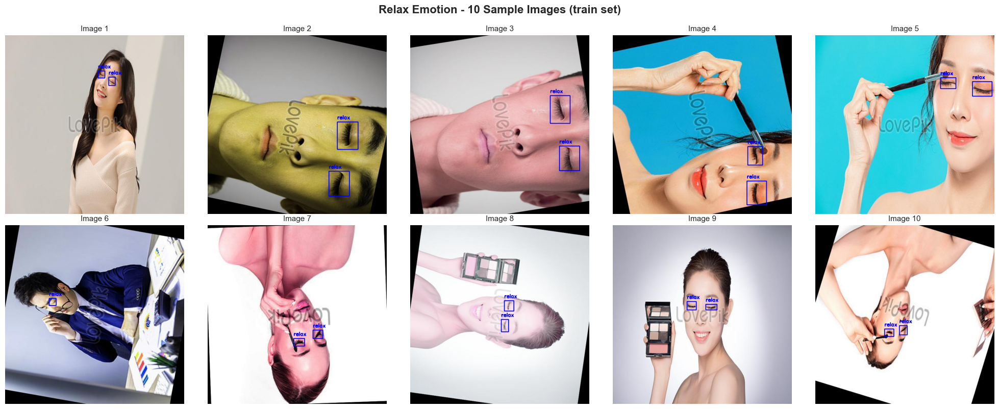

Found 10 images for emotion: 'rock' in train dataset



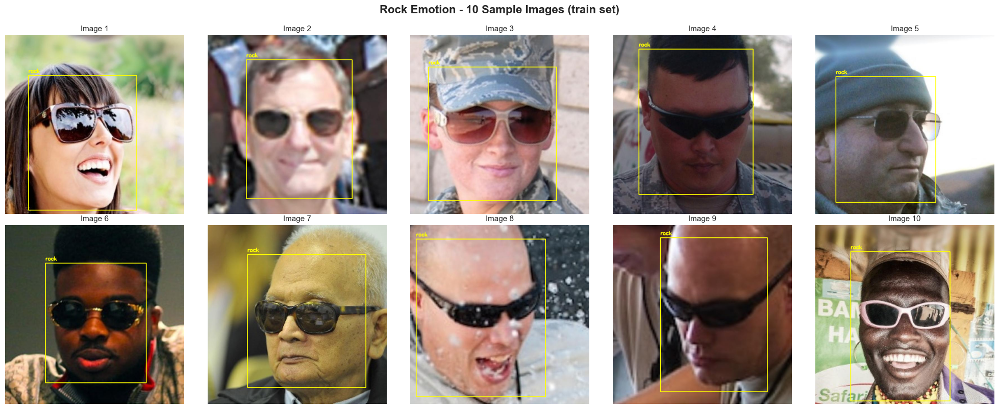

Found 10 images for emotion: 'romantic' in train dataset



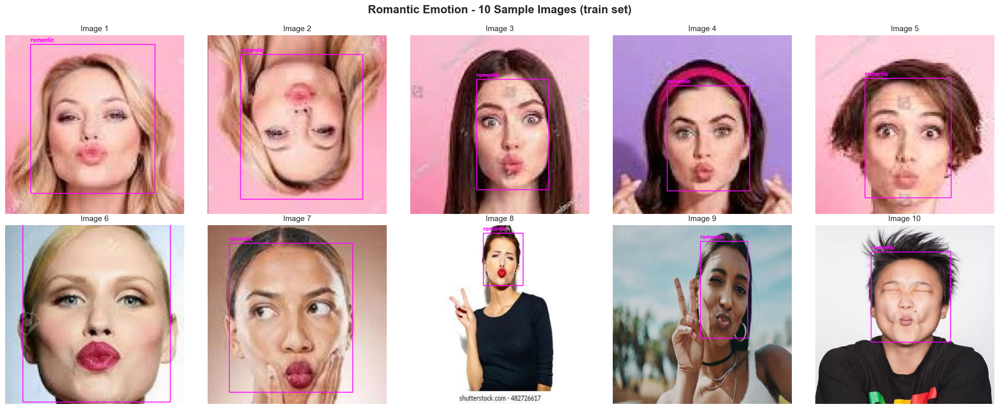

In [63]:
def draw_bounding_boxes(image_path, label_path, class_names):
    """
    Draw bounding boxes on an image based on YOLO format labels.
    """
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Parse labels
    annotations = parse_yolo_label(label_path)
    
    # Define colors for each class
    colors = [
        (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
        (255, 0, 255), (0, 255, 255), (128, 0, 128)
    ]
    
    # Draw each bounding box
    for ann in annotations:
        class_id, center_x, center_y, bbox_w, bbox_h = ann
        
        # Convert normalized coordinates to pixel coordinates
        x1 = int((center_x - bbox_w/2) * w)
        y1 = int((center_y - bbox_h/2) * h)
        x2 = int((center_x + bbox_w/2) * w)
        y2 = int((center_y + bbox_h/2) * h)
        
        # Draw rectangle
        color = colors[class_id % len(colors)]
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        
        # Add label
        label = class_names[class_id]
        cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 
                   0.6, color, 2)
    
    return img

# Find images for each class
def find_images_by_class(images_dir, labels_dir, class_id, max_samples=3):
    """Find image files that contain a specific class."""
    matching_images = []
    label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]
    
    for label_file in label_files:
        if len(matching_images) >= max_samples:
            break
            
        label_path = os.path.join(labels_dir, label_file)
        annotations = parse_yolo_label(label_path)
        
        # Check if this label file contains the target class
        for ann in annotations:
            if ann[0] == class_id:
                # Find corresponding image file
                img_file = label_file.replace('.txt', '.jpg')
                img_path = os.path.join(images_dir, img_file)
                
                if os.path.exists(img_path):
                    matching_images.append((img_path, label_path))
                    break
    
    return matching_images

def visualize_class_images(class_name, num_images=10, dataset='train'):
    """
    Visualize multiple images from a specific emotion class.
    
    Parameters:
    -----------
    class_name : str
        Name of the emotion class (e.g., 'angry', 'happy', 'sad')
    num_images : int
        Number of images to display (default: 10)
    dataset : str
        Which dataset to use: 'train', 'valid', or 'test' (default: 'train')
    """
    # Validate inputs
    if class_name not in class_names:
        print(f"Error: '{class_name}' is not a valid class name.")
        print(f"Valid classes: {', '.join(class_names)}")
        return
    
    # Get class ID
    class_id = class_names.index(class_name)
    
    # Select appropriate directories based on dataset
    if dataset == 'train':
        images_dir = train_images
        labels_dir = train_labels
    elif dataset == 'valid':
        images_dir = valid_images
        labels_dir = valid_labels
    elif dataset == 'test':
        images_dir = test_images
        labels_dir = test_labels
    else:
        print(f"Error: Invalid dataset '{dataset}'. Use 'train', 'valid', or 'test'.")
        return
    
    # Find images for the specified class
    matching_images = find_images_by_class(images_dir, labels_dir, class_id, max_samples=num_images)
    
    if not matching_images:
        print(f"No images found for class '{class_name}' in {dataset} dataset.")
        return
    
    print(f"Found {len(matching_images)} images for emotion: '{class_name}' in {dataset} dataset\n")
    
    # Calculate grid dimensions
    num_found = len(matching_images)
    cols = 5
    rows = (num_found + cols - 1) // cols  # Ceiling division
    
    # Create figure
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    
    # Handle single row case
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    # Display images
    for idx in range(rows * cols):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
        
        if idx < num_found:
            img_path, label_path = matching_images[idx]
            img_with_boxes = draw_bounding_boxes(img_path, label_path, class_names)
            ax.imshow(img_with_boxes)
            ax.set_title(f'Image {idx+1}', fontsize=11)
        else:
            ax.axis('off')
            continue
        
        ax.axis('off')
    
    plt.suptitle(f'{class_name.capitalize()} Emotion - {num_found} Sample Images ({dataset} set)', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

# Uncomment and run to visualize other emotions:
visualize_class_images('happy', num_images=10, dataset='train')
visualize_class_images('angry', num_images=10, dataset='train')
visualize_class_images('sad', num_images=10, dataset='train')
visualize_class_images('surprise', num_images=10, dataset='train')
visualize_class_images('relax', num_images=10, dataset='train')
visualize_class_images('rock', num_images=10, dataset='train')
visualize_class_images('romantic', num_images=10, dataset='train')